# Entry 47 notebook - Pruning Trees

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import graphviz
import openml

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split

import pydotplus
from sklearn import tree
from IPython.display import Image

## Iris Dataset

In [48]:
iris = sns.load_dataset('iris')

X_train, X_test, y_train, y_test = train_test_split(iris.iloc[:, :-1], iris['species'],
                                                    train_size=.8, stratify=iris['species'], random_state=12)

In [22]:
def create_viz_tree(X_train, y_train, tree_clf, file_name, features=X_train.columns.tolist(), classes=y_train.unique().tolist()):
    tree_clf.fit(X_train,y_train)
    dot_data = tree.export_graphviz(tree_clf, out_file=None,
               feature_names=features,
               class_names = classes,
               rounded=True,
               filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data)
    graph.write_png(file_name)
    return Image(graph.create_png())

### Unlimited Tree

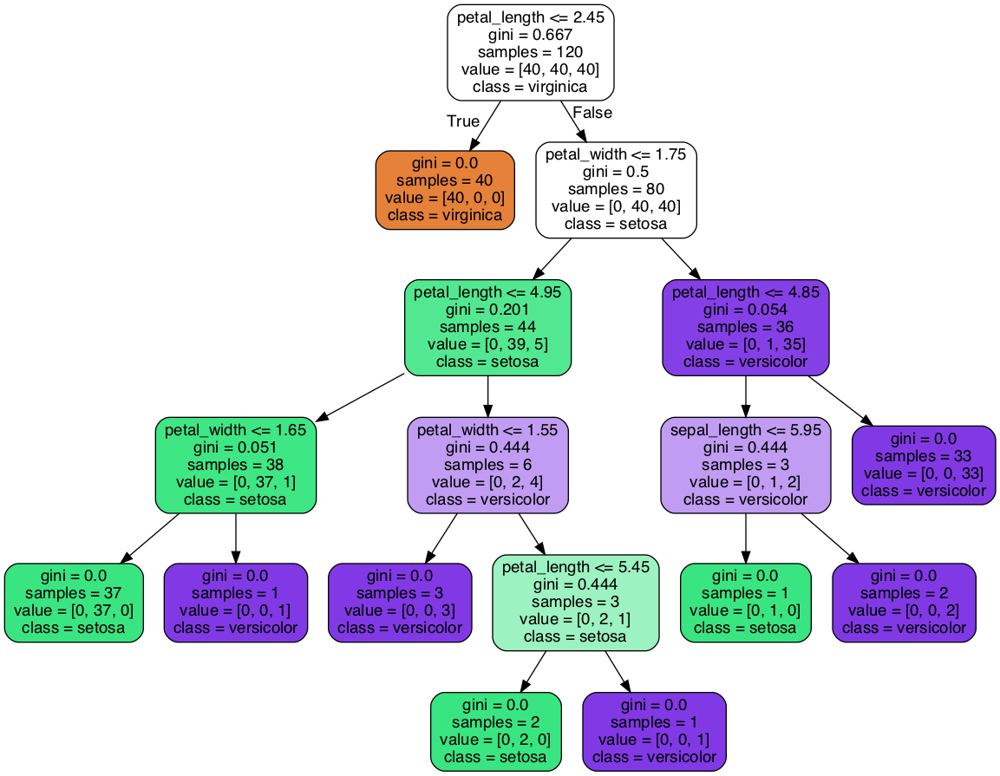

In [23]:
tree_clf = DecisionTreeClassifier()
file_path = 'images/iris_tree.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Max Depth Three

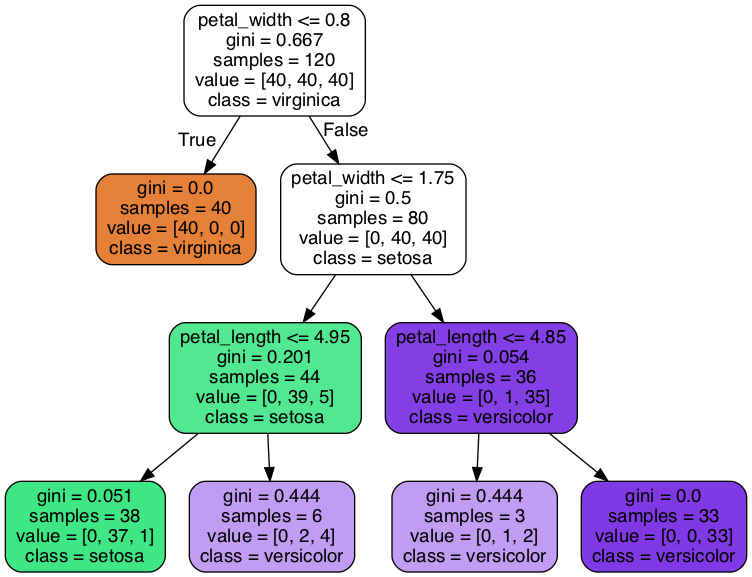

In [49]:
tree_clf = DecisionTreeClassifier(max_depth=3)
file_path = 'images/iris_tree_d3.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Max Depth Four

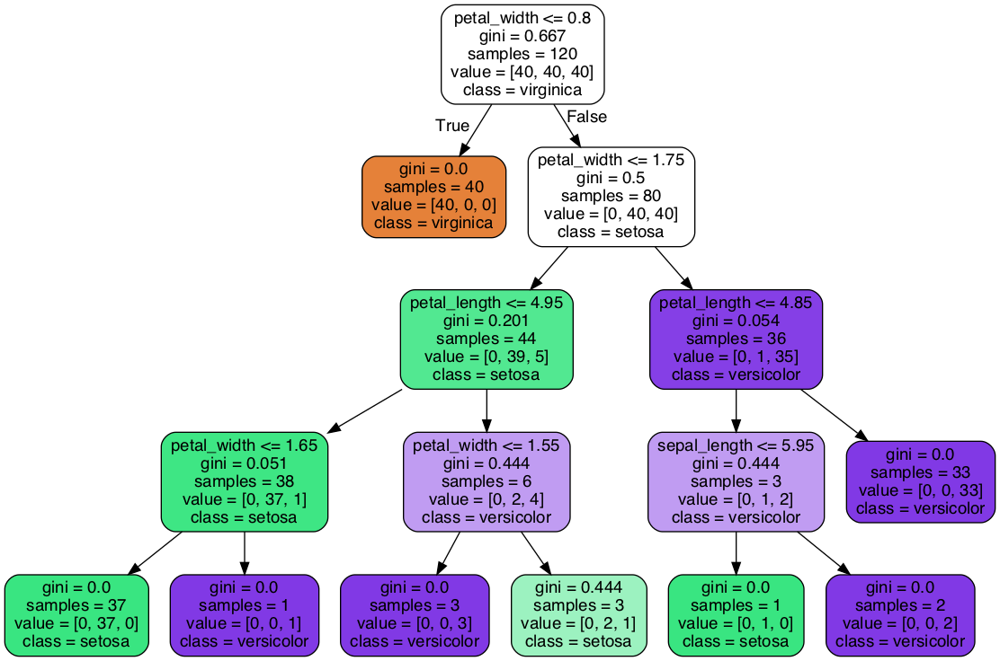

In [10]:
tree_clf = DecisionTreeClassifier(max_depth=4)
file_path = 'images/iris_tree_d4.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Five Minimum Samples per Split

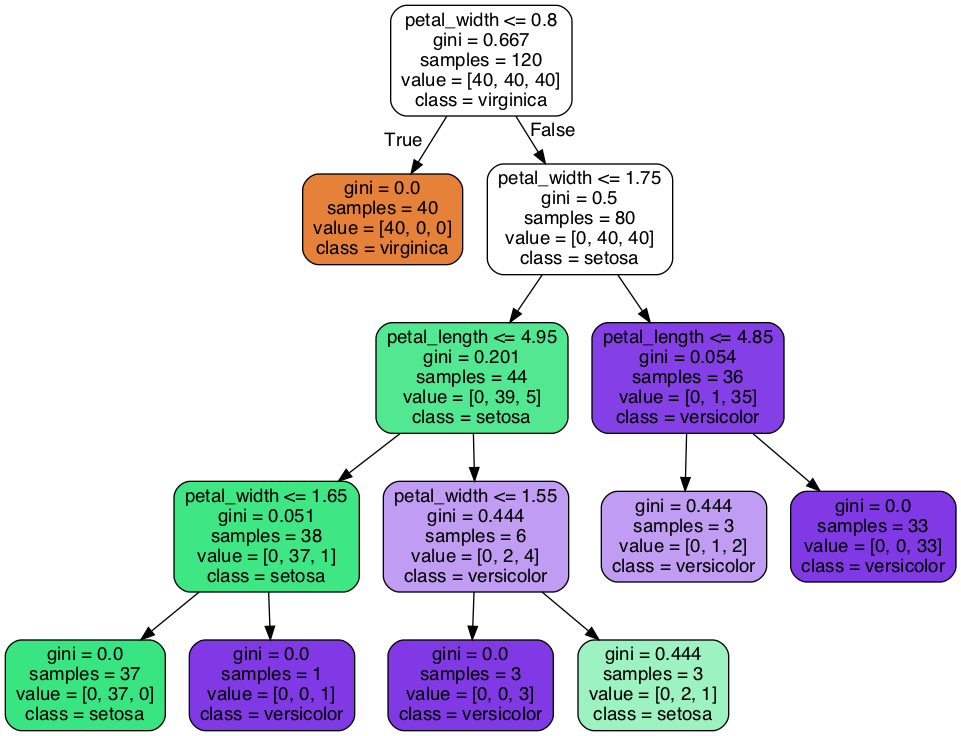

In [8]:
tree_clf = DecisionTreeClassifier(min_samples_split = 5)
file_path = 'images/iris_tree_split5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Five Minimum Samples per Leaf

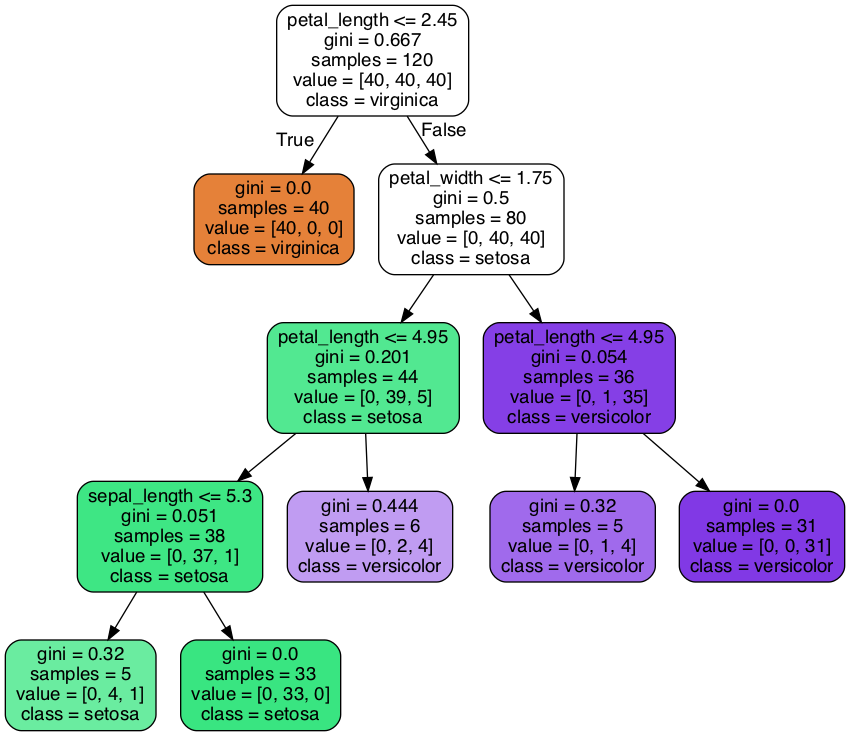

In [9]:
tree_clf = DecisionTreeClassifier(min_samples_leaf = 5)
file_path = 'images/iris_tree_leaf5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Maximum Number of Leaves at Five

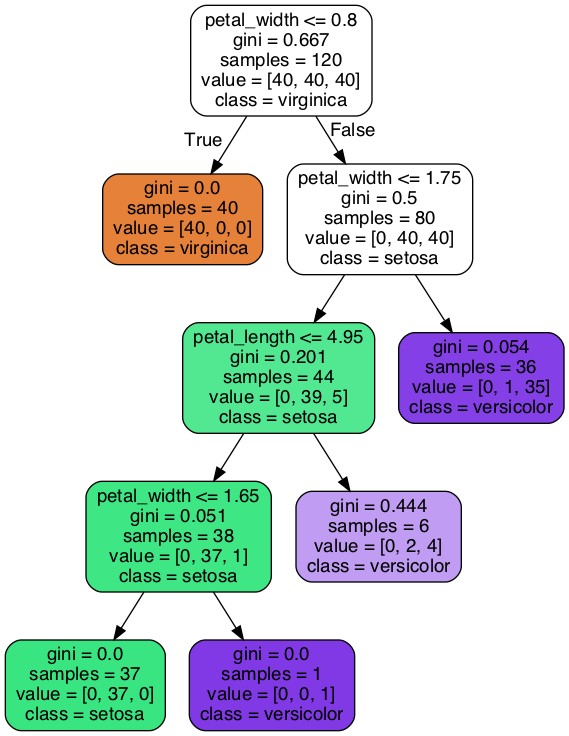

In [11]:
tree_clf = DecisionTreeClassifier(max_leaf_nodes = 5)
file_path = 'images/iris_tree_5leaves.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Minimum Impurity Decrease

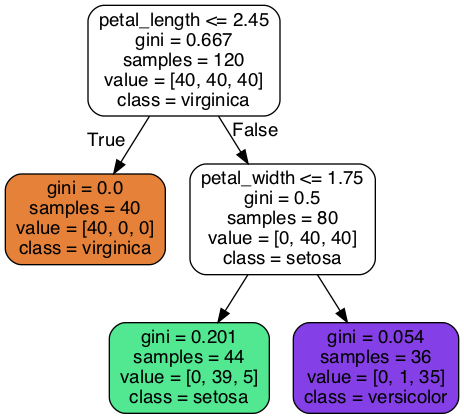

In [60]:
tree_clf = DecisionTreeClassifier(min_impurity_decrease = 0.04)
file_path = 'images/iris_tree_min_impur_decr_04.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

### Minimum Impurity at Split

//anaconda3/lib/python3.7/site-packages/sklearn/tree/_classes.py:310: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  FutureWarning)


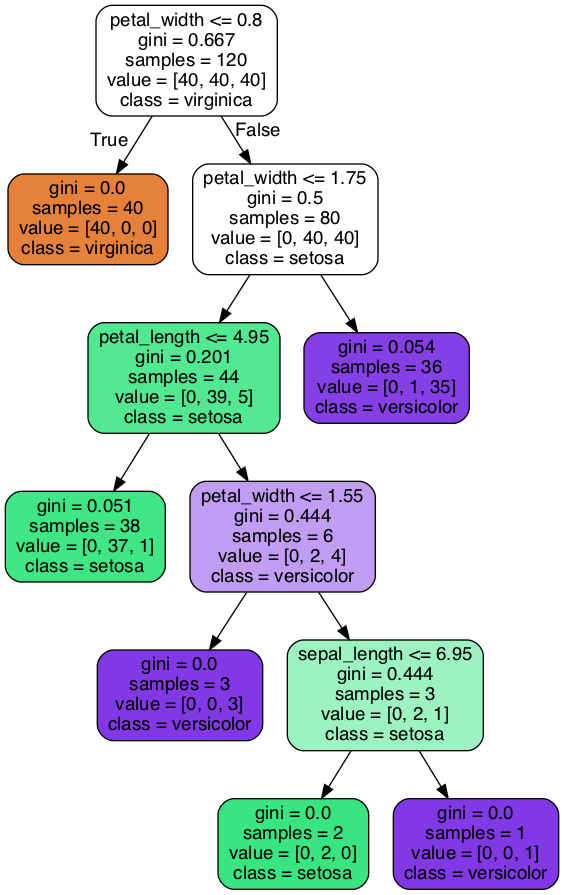

In [66]:
tree_clf = DecisionTreeClassifier(min_impurity_split = 0.2)
file_path = 'images/iris_tree_min_impur_split_02.png'

create_viz_tree(X_train, y_train, tree_clf, file_path)

## Breast Cancer dataset

In [69]:
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    train_size=.8, stratify=cancer.target, random_state=12)

### Unlimited Tree

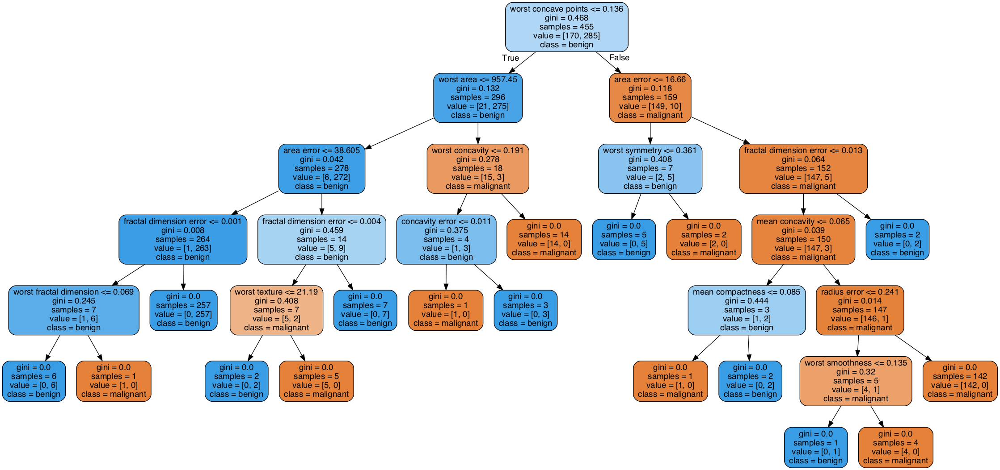

In [25]:
tree_clf = DecisionTreeClassifier()
file_path = 'images/cancer_tree.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Max Depth Four

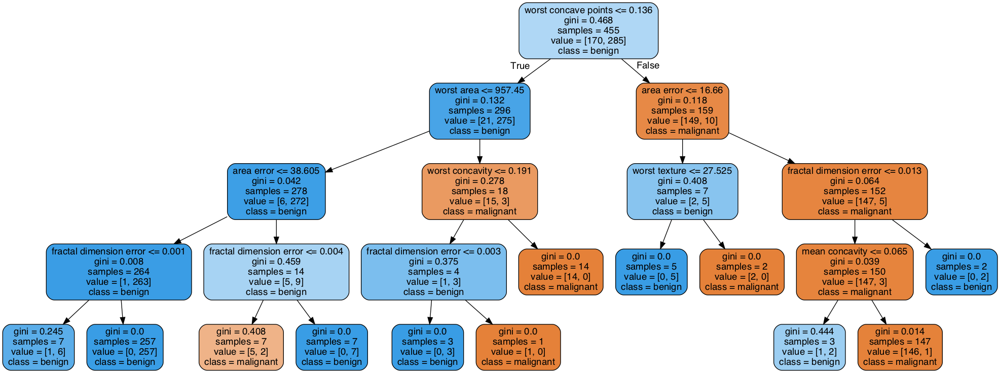

In [26]:
tree_clf = DecisionTreeClassifier(max_depth=4)
file_path = 'images/cancer_tree_d4.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Five Minimum Samples per Split

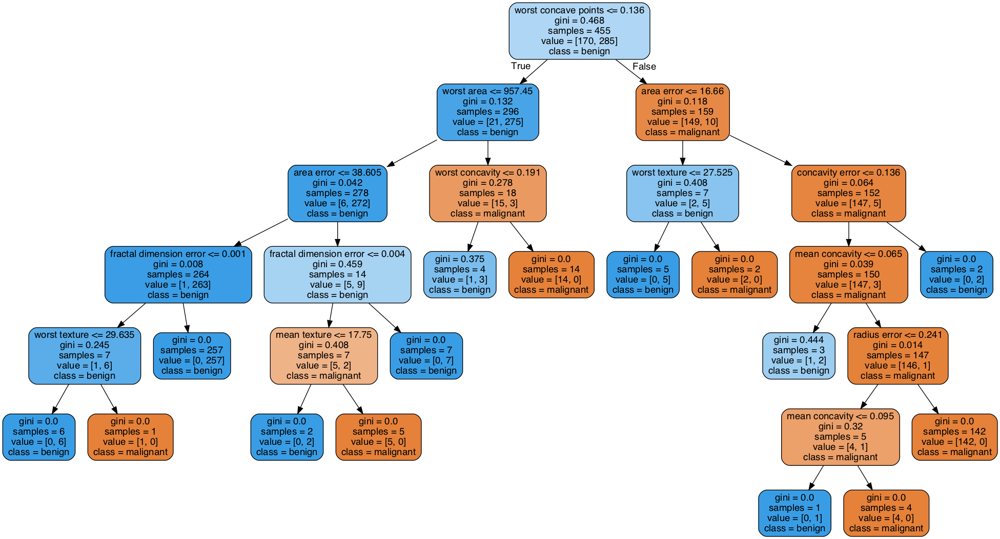

In [27]:
tree_clf = DecisionTreeClassifier(min_samples_split = 5)
file_path = 'images/cancer_tree_split5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Five Minimum Samples per Leaf

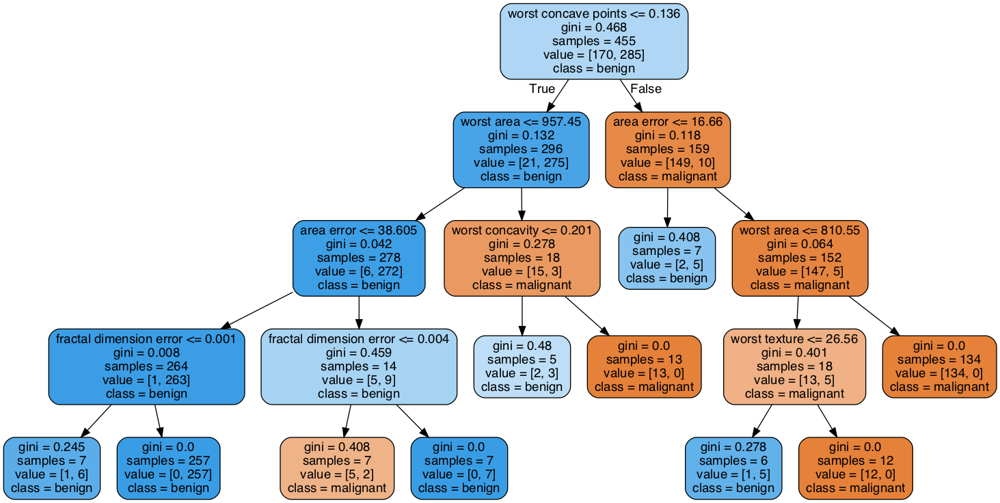

In [28]:
tree_clf = DecisionTreeClassifier(min_samples_leaf = 5)
file_path = 'images/cancer_tree_leaf5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Maximum Number of Leaves at Five

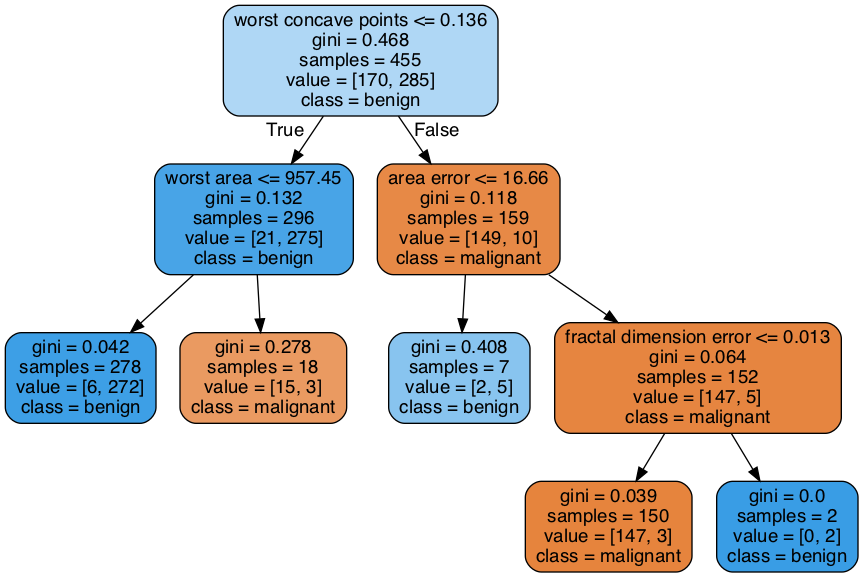

In [30]:
tree_clf = DecisionTreeClassifier(max_leaf_nodes = 5)
file_path = 'images/cancer_tree_5leaves.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Minimum Impurity Decrease

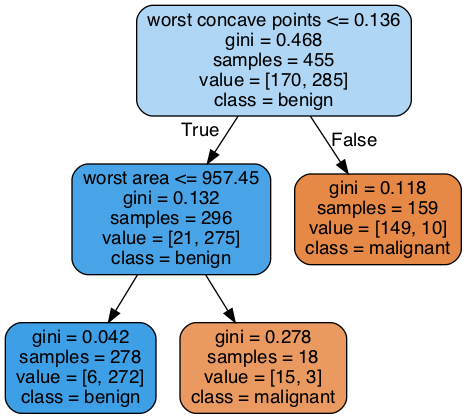

In [70]:
tree_clf = DecisionTreeClassifier(min_impurity_decrease = 0.04)
file_path = 'images/cancer_tree_min_impur_decr_04.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

### Minimum Impurity at Split

//anaconda3/lib/python3.7/site-packages/sklearn/tree/_classes.py:310: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  FutureWarning)


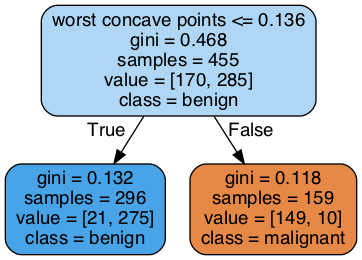

In [71]:
tree_clf = DecisionTreeClassifier(min_impurity_split = 0.2)
file_path = 'images/cancer_tree_min_impur_split_02.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features = cancer.feature_names, classes = cancer.target_names)

## Titanic Dataset

In [72]:
import category_encoders as ce

In [73]:
titanic = sns.load_dataset('titanic')
drop_cols = ['age', 'who', 'deck', 'embark_town', 'alive', 'class', 'embarked', 'deck']
titanic.drop(drop_cols, axis=1, inplace=True)

binary_cols = ['sex', 'adult_male', 'alone']
index=titanic.index.tolist()
encoder = ce.OrdinalEncoder(cols=binary_cols)
oe_binary = pd.DataFrame(encoder.fit_transform(titanic[binary_cols]), index=index)

titanic_prep = pd.concat([titanic.drop(binary_cols, axis=1), oe_binary], axis=1)

//anaconda3/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [74]:
X_train, X_test, y_train, y_test = train_test_split(titanic_prep.drop('survived', axis=1), titanic_prep['survived'],
                                                    train_size=.8, stratify=titanic_prep['survived'], random_state=12)

### Unlimited Tree

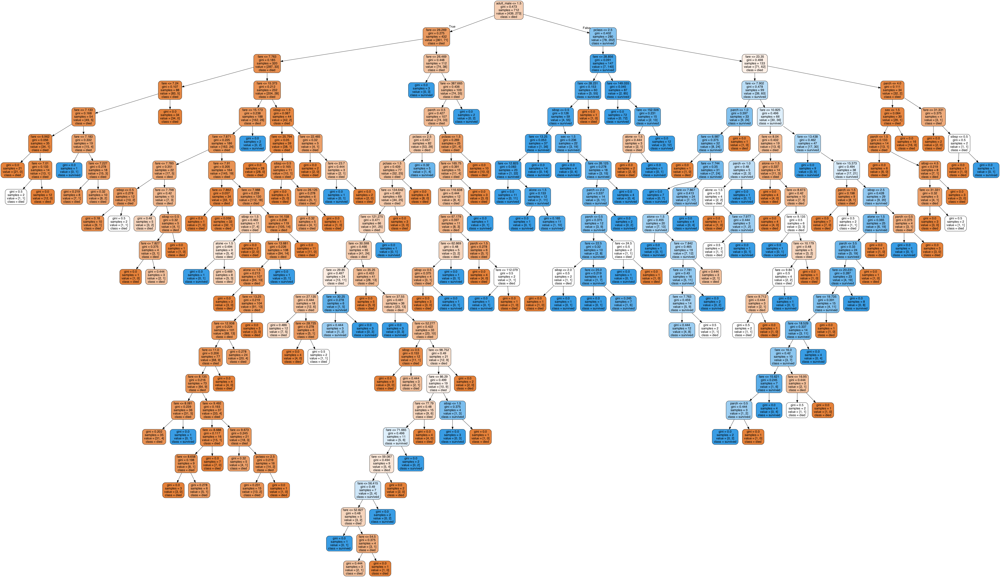

In [37]:
tree_clf = DecisionTreeClassifier()
file_path = 'images/titanic_tree.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Max Depth Four

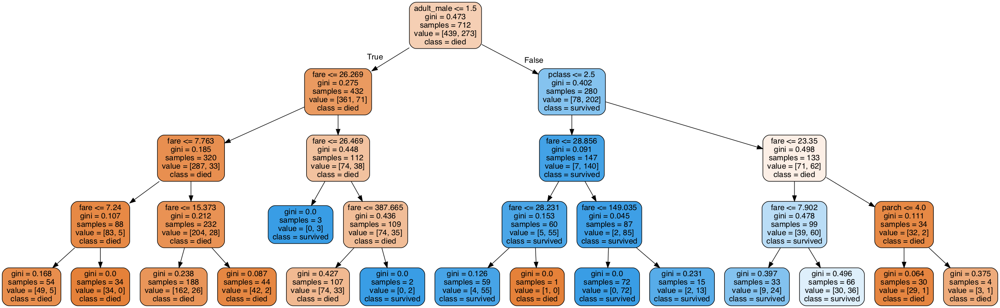

In [38]:
tree_clf = DecisionTreeClassifier(max_depth=4)
file_path = 'images/titanic_tree_d4.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Five Minimum Samples per Split

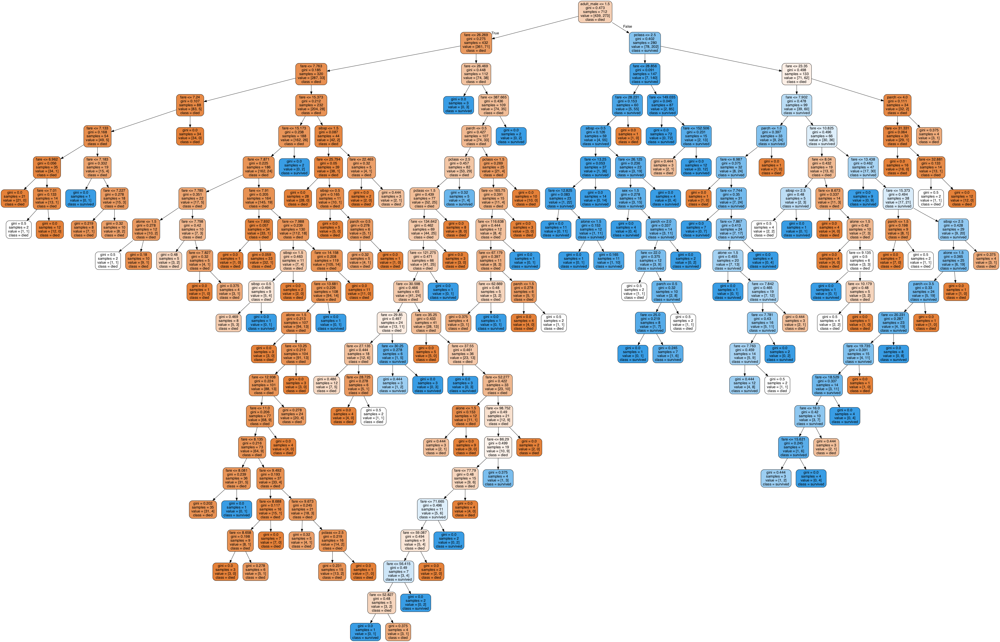

In [47]:
tree_clf = DecisionTreeClassifier(min_samples_split = 5)
file_path = 'images/titanic_tree_split5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Fifteen Minimum Samples per Split

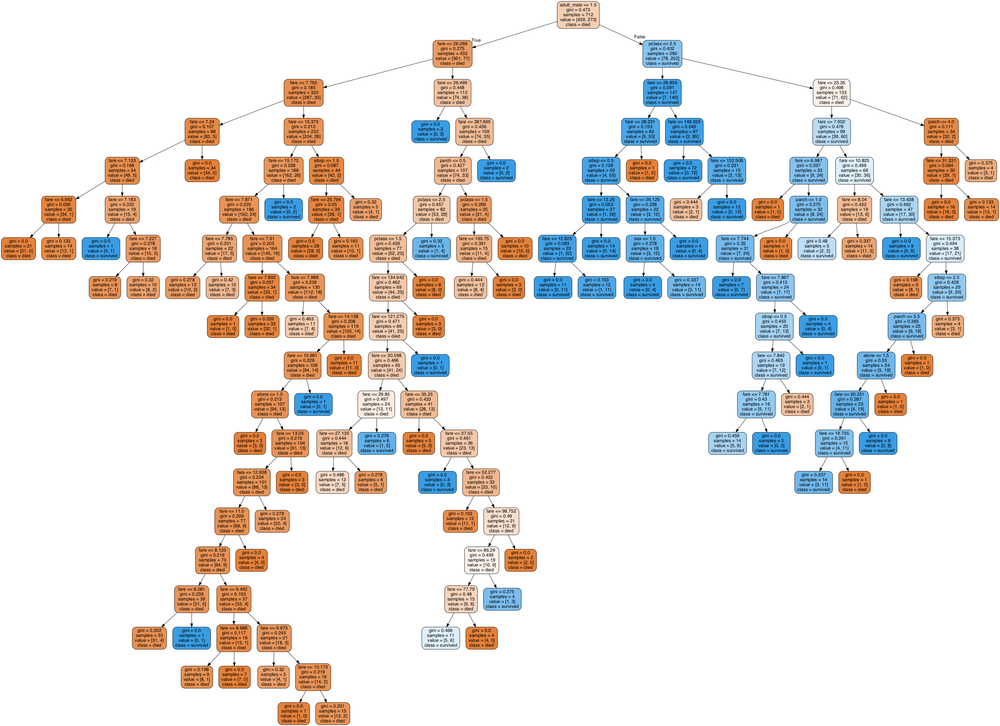

In [42]:
tree_clf = DecisionTreeClassifier(min_samples_split = 15)
file_path = 'images/titanic_tree_split15.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Five Minimum Samples per Leaf

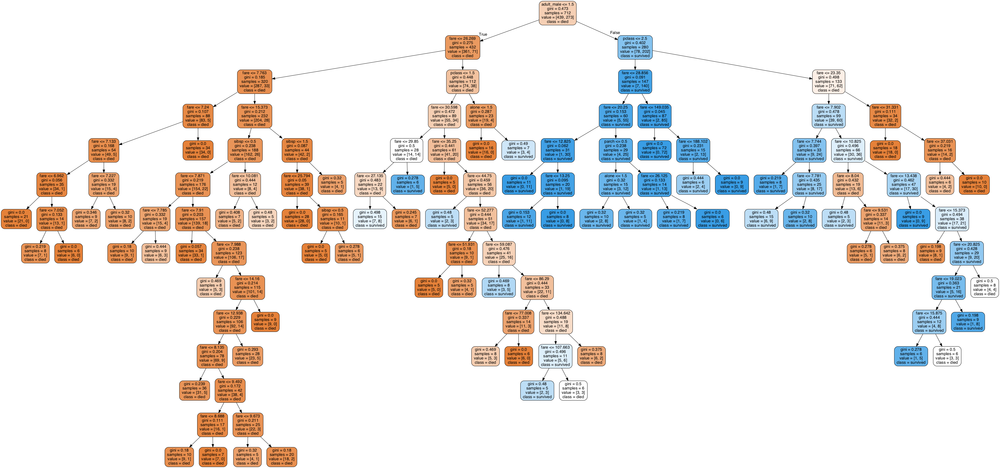

In [46]:
tree_clf = DecisionTreeClassifier(min_samples_leaf = 5)
file_path = 'images/titanic_tree_leaf5.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Fifteen Minimum Samples per Leaf

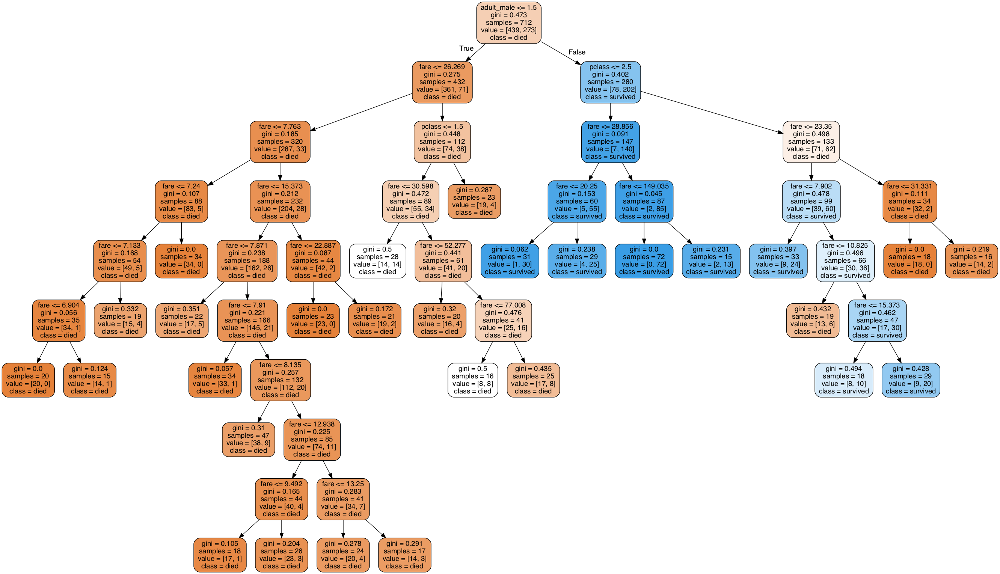

In [43]:
tree_clf = DecisionTreeClassifier(min_samples_leaf = 15)
file_path = 'images/titanic_tree_leaf15.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Maximum Number of Leaves at Five

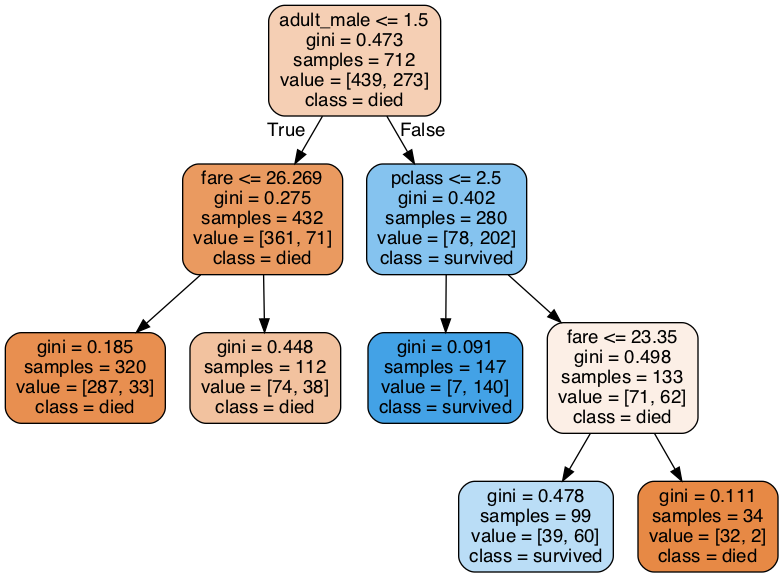

In [45]:
tree_clf = DecisionTreeClassifier(max_leaf_nodes = 5)
file_path = 'images/titanic_tree_5leaves.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Maximum Number of Leaves at Fifteen

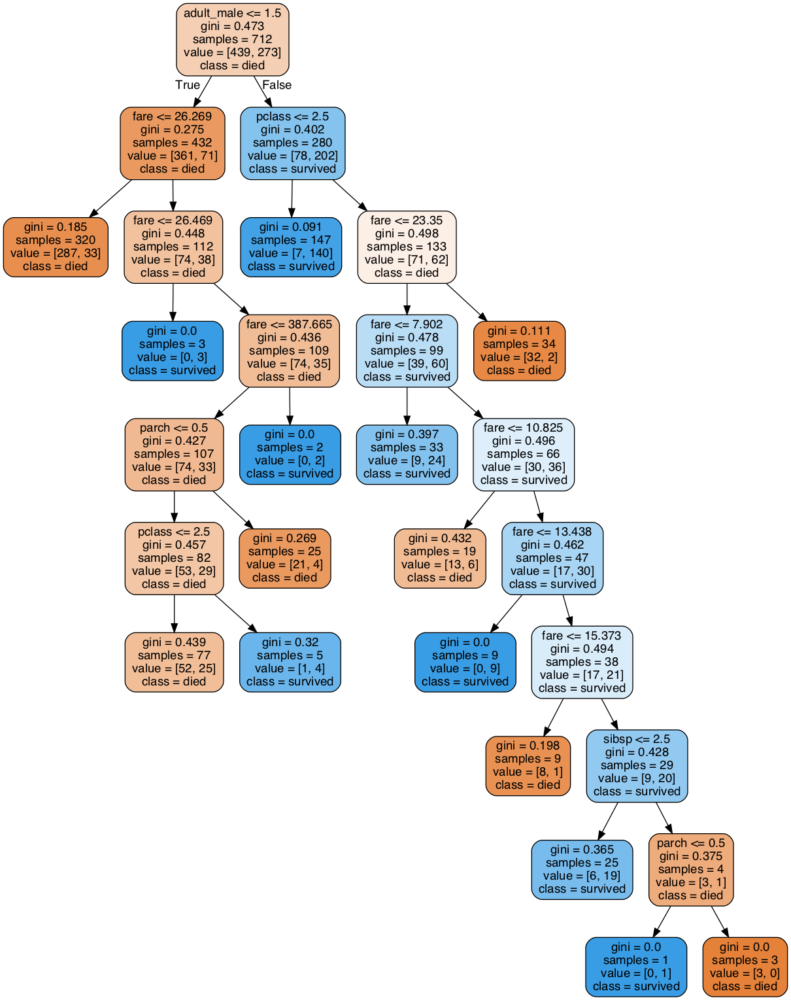

In [44]:
tree_clf = DecisionTreeClassifier(max_leaf_nodes = 15)
file_path = 'images/titanic_tree_15leaves.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Minimum Impurity Decrease

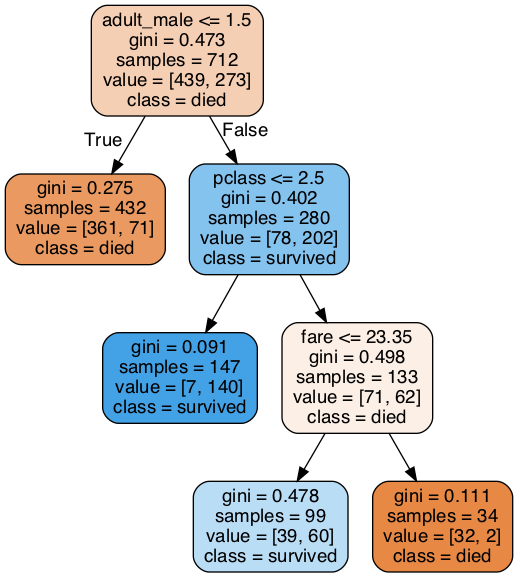

In [81]:
tree_clf = DecisionTreeClassifier(min_impurity_decrease = 0.02)
file_path = 'images/titanic_tree_min_impur_decr_02.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

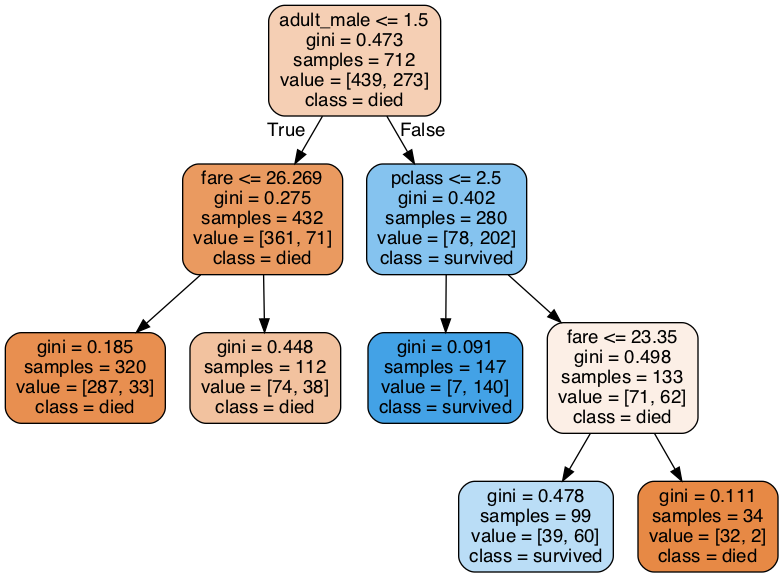

In [82]:
tree_clf = DecisionTreeClassifier(min_impurity_decrease = 0.01)
file_path = 'images/titanic_tree_min_impur_decr_01.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])

### Minimum Impurity at Split

//anaconda3/lib/python3.7/site-packages/sklearn/tree/_classes.py:310: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  FutureWarning)


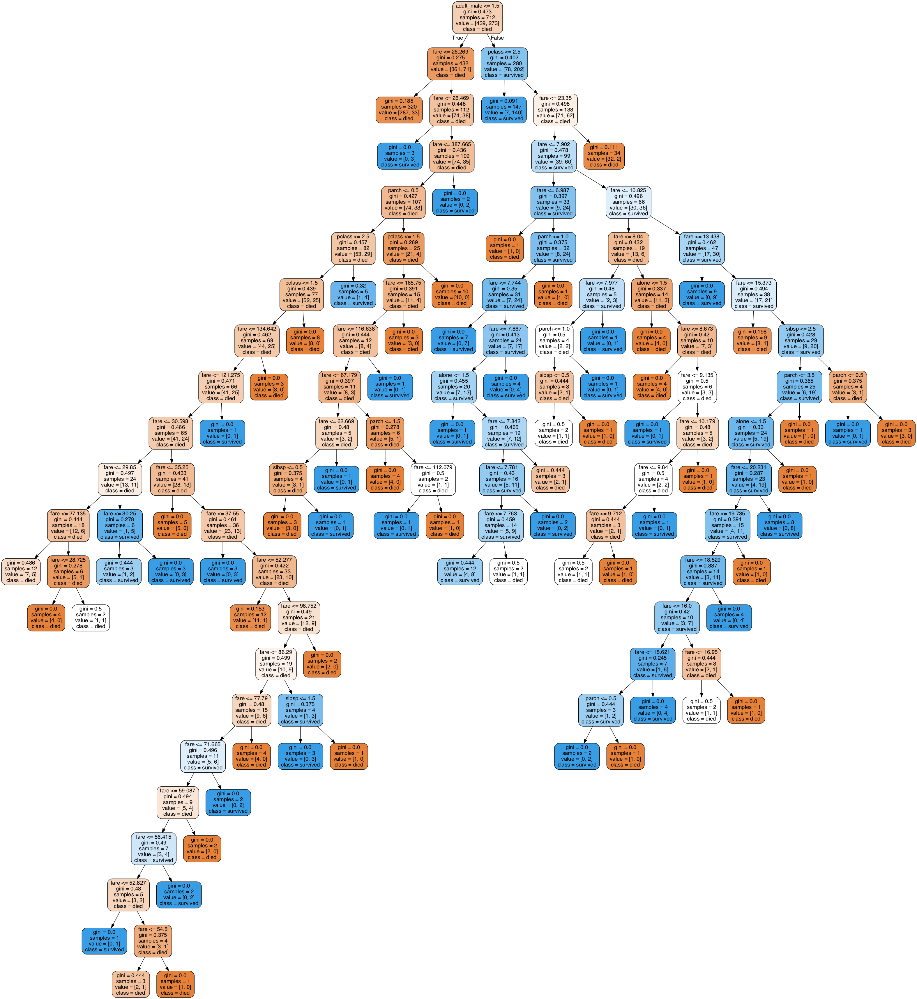

In [76]:
tree_clf = DecisionTreeClassifier(min_impurity_split = 0.2)
file_path = 'images/titanic_tree_min_impur_split_02.png'

create_viz_tree(X_train, y_train, tree_clf, file_path, features=X_train.columns.tolist(), classes=['died', 'survived'])